<a href="https://colab.research.google.com/github/surajjorwar/FitnessTracker/blob/main/Visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

In [3]:
df = pd.read_pickle('/content/drive/MyDrive/FitnessTracker/FitnessTracker/data-science-template-main/data/interim/01_data_processed.pkl')

In [4]:
df.head(2)

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.0135,0.9770,-0.0710,-1.8904,2.4392,0.9388,B,bench,heavy,71
2019-01-11 15:08:05.400,-0.0015,0.9705,-0.0795,-1.6826,-0.8904,2.1708,B,bench,heavy,71


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9009 entries, 2019-01-11 15:08:05.200000 to 2019-01-20 17:33:27.800000
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   acc_x        9009 non-null   float64
 1   acc_y        9009 non-null   float64
 2   acc_z        9009 non-null   float64
 3   gyr_x        9009 non-null   float64
 4   gyr_y        9009 non-null   float64
 5   gyr_z        9009 non-null   float64
 6   participant  9009 non-null   object 
 7   label        9009 non-null   object 
 8   category     9009 non-null   object 
 9   set          9009 non-null   int64  
dtypes: float64(6), int64(1), object(3)
memory usage: 774.2+ KB


# Load data

In [6]:
df = pd.read_pickle('/content/drive/MyDrive/FitnessTracker/FitnessTracker/data-science-template-main/data/interim/01_data_processed.pkl')

# Plot single columns

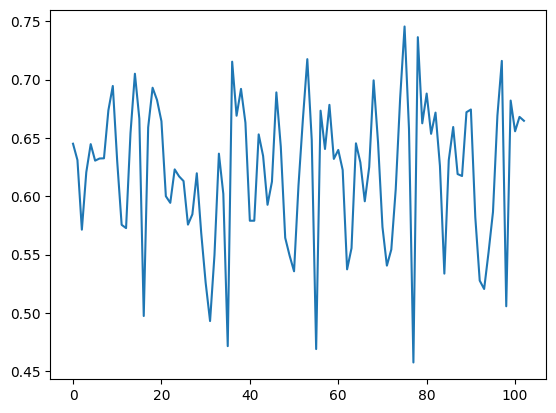

In [7]:
set_df = df[df['set']==1]
plt.plot(set_df['acc_y'].reset_index(drop =True))

# Plot all exercises

In [8]:
df['label'].unique()

array(['bench', 'ohp', 'squat', 'dead', 'row', 'rest'], dtype=object)

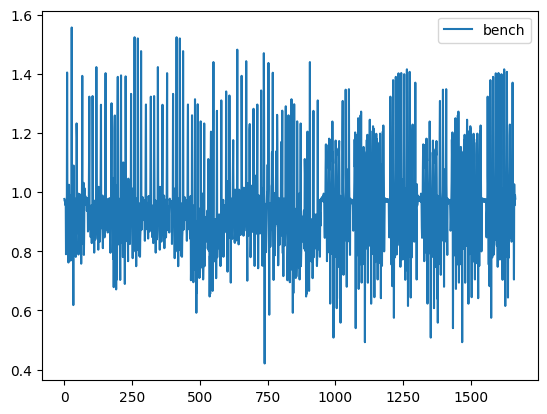

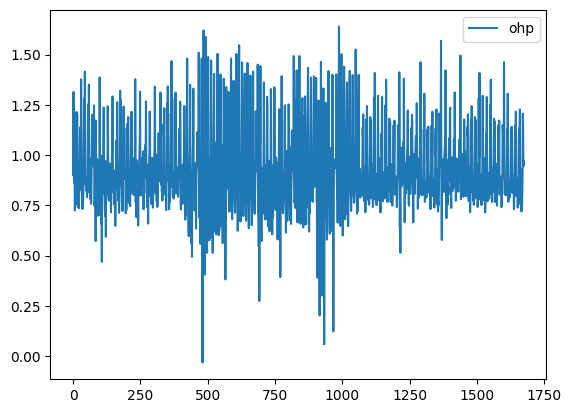

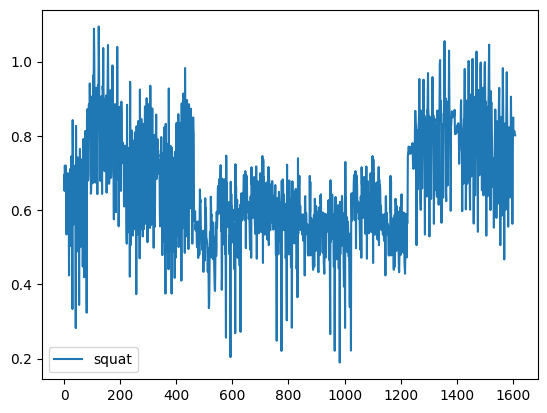

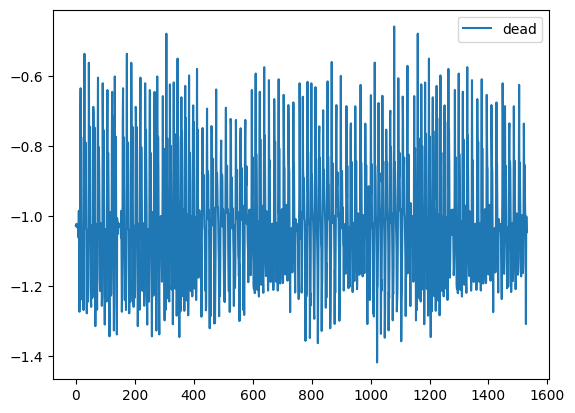

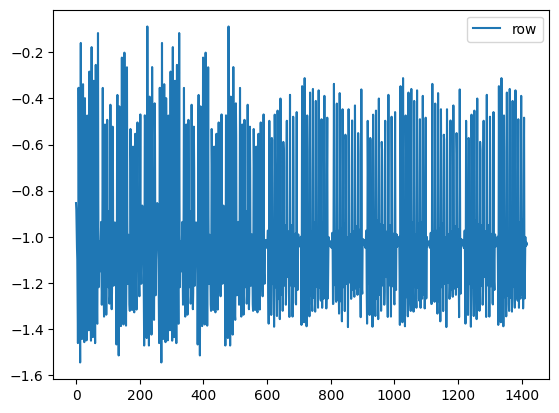

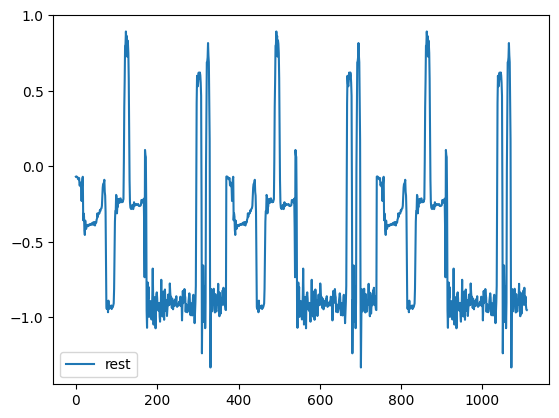

In [9]:
for label in df['label'].unique() :
  subset = df[df['label']==label]
  fig,ax =plt.subplots()
  plt.plot(subset['acc_y'].reset_index(drop = True,),label = label)
  plt.legend()
  plt.show()


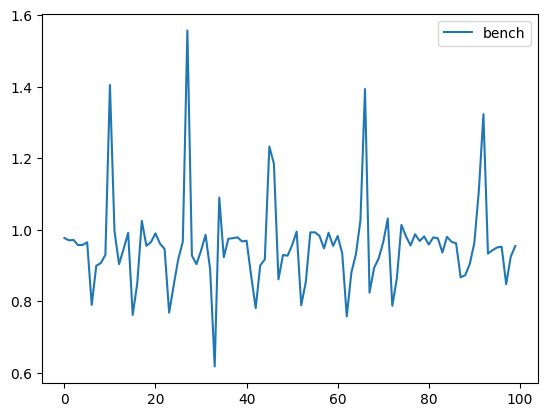

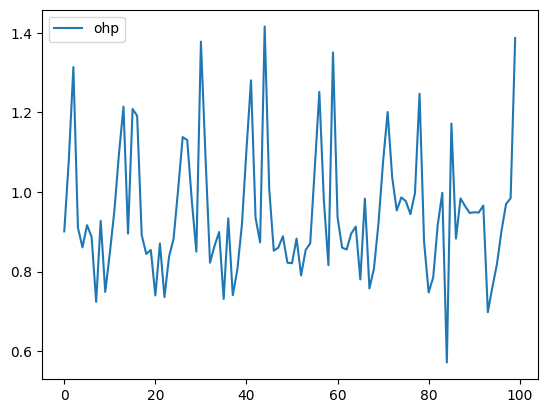

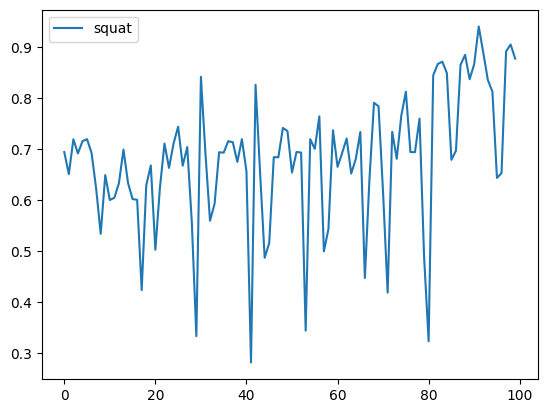

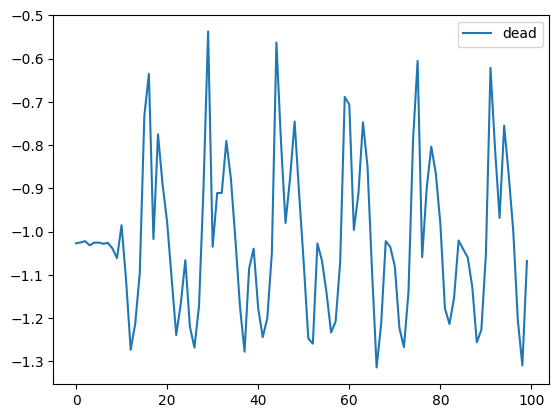

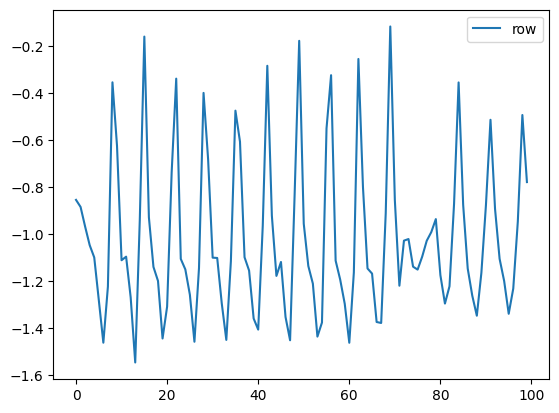

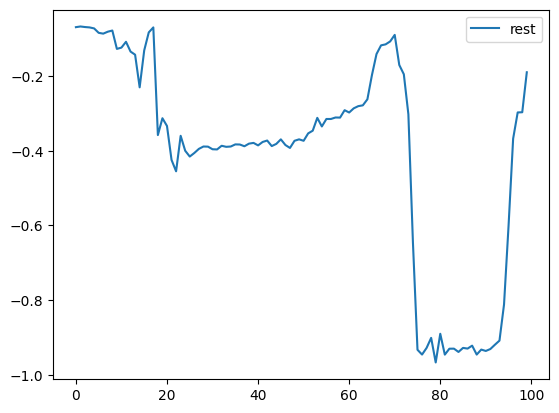

In [10]:
for label in df['label'].unique() :
  subset = df[df['label']==label]
  fig,ax =plt.subplots()
  plt.plot(subset[:100]['acc_y'].reset_index(drop = True,),label = label)
  plt.legend()
  plt.show()


# Adjust plot settings

In [11]:
mpl.style.use('seaborn-v0_8-deep')
mpl.rcParams['figure.figsize']= (20,5)
mpl.rcParams['figure.dpi']= 100

# Compare medium vs. heavy sets

In [12]:
category_df = df.query("label == 'squat'").query("participant =='A'").reset_index()

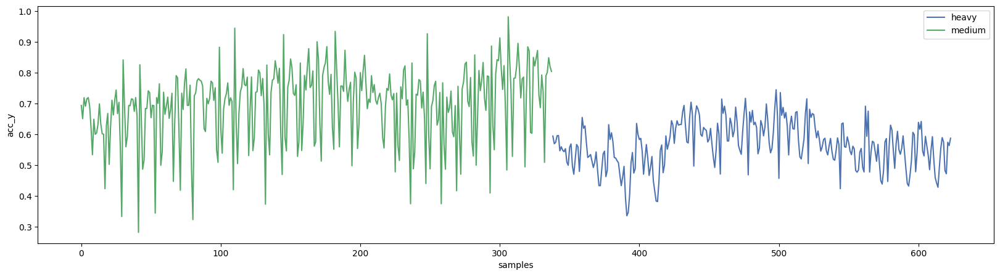

In [13]:
fig, ax = plt.subplots()
category_df.groupby(['category'])['acc_y'].plot()
ax.set_ylabel('acc_y')
ax.set_xlabel('samples')
plt.legend()
plt.show()

# Compare participants

In [14]:
participants_df = df.query("label =='bench'").sort_values('participant').reset_index()

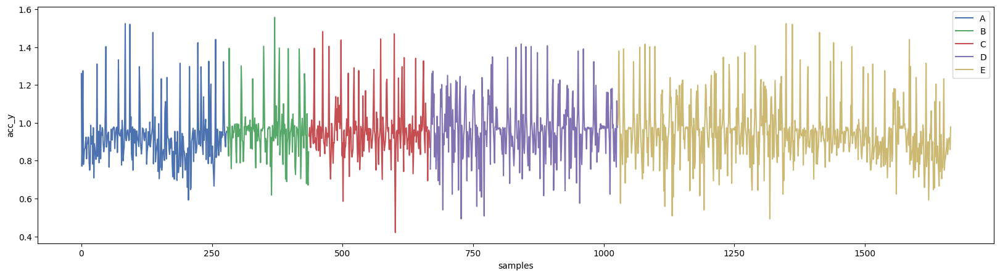

In [15]:
fig, ax = plt.subplots()
participants_df.groupby(['participant'])['acc_y'].plot()
ax.set_ylabel('acc_y')
ax.set_xlabel('samples')
plt.legend()
plt.show()

# Plot multiple axis

In [16]:
label = "squat"
participant = "A"
all_axis_df = df.query(f"label =='{label}'").query(f"participant == '{participant}'").reset_index()

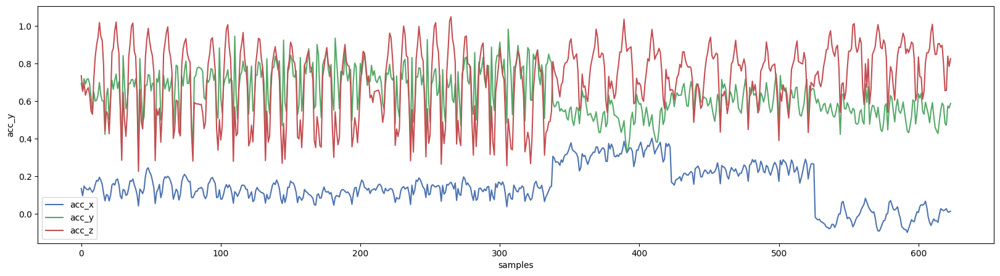

In [17]:
fig, ax = plt.subplots()
all_axis_df[['acc_x','acc_y','acc_z']].plot(ax=ax)
ax.set_ylabel('acc_y')
ax.set_xlabel('samples')
plt.legend()
plt.show()


# Create a loop to plot all combinations per sensor

In [18]:
labels = df['label'].unique()
participants = df['participant'].unique()

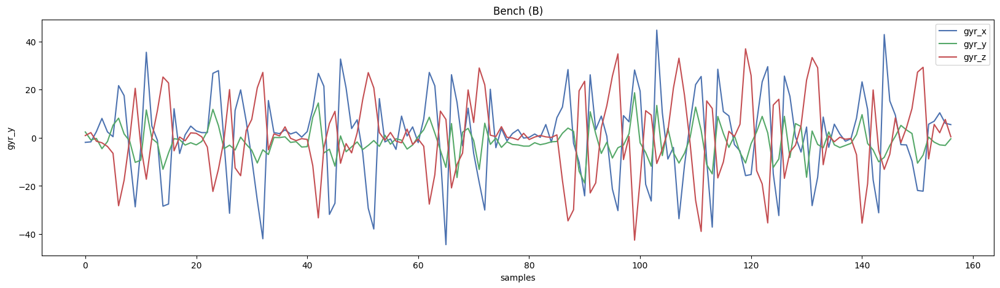

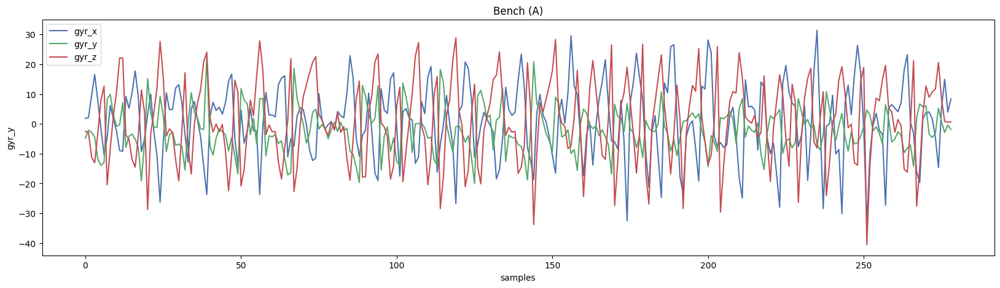

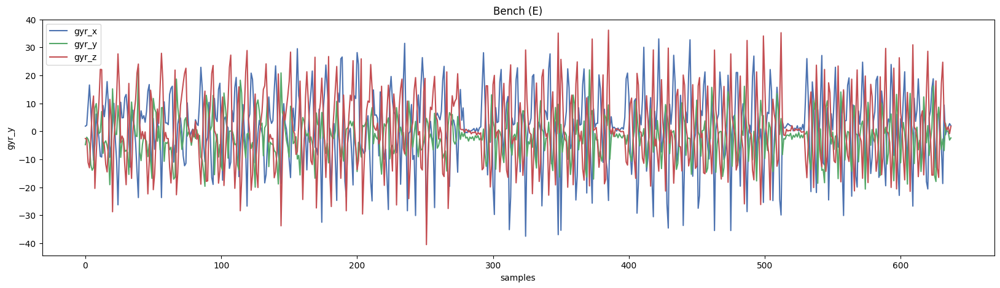

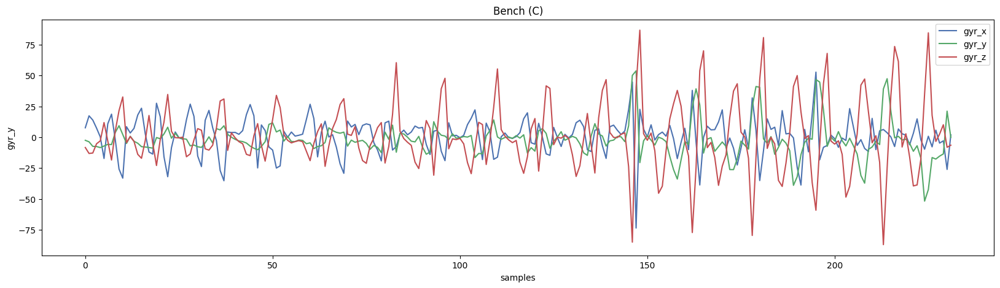

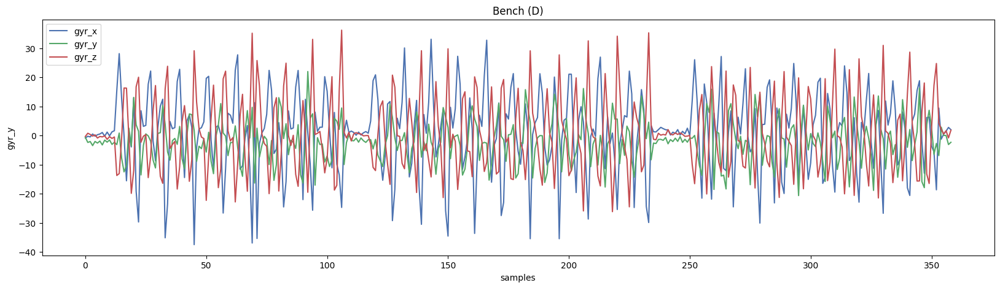

...

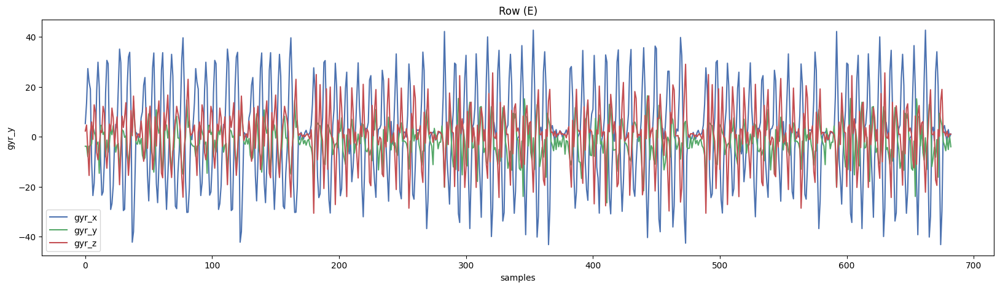

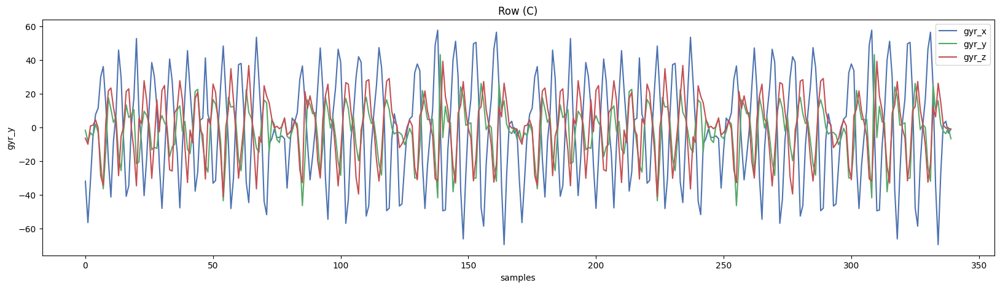

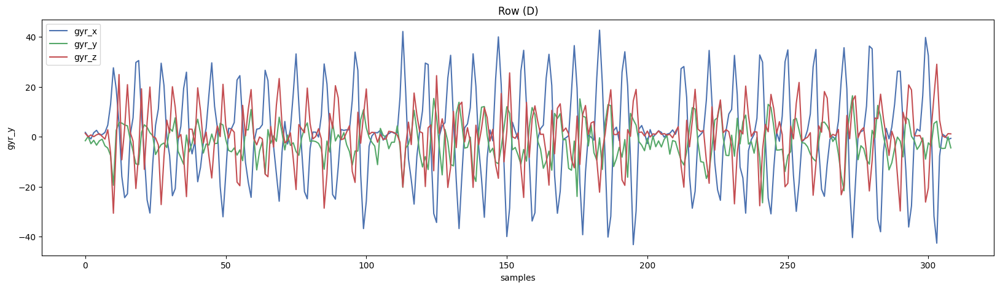

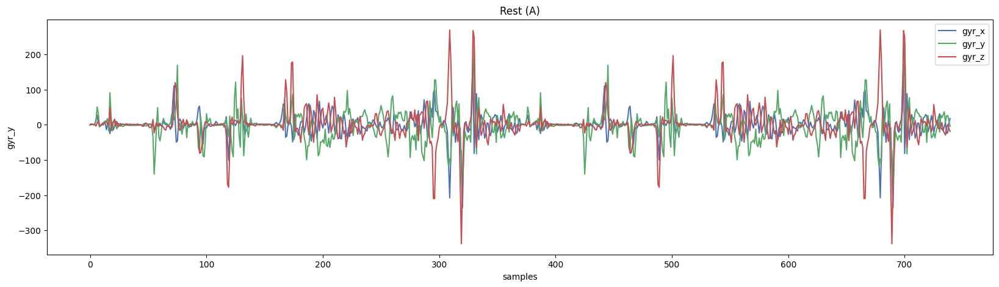

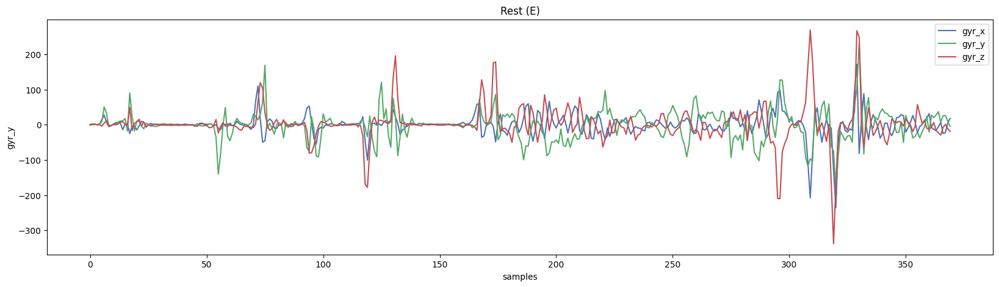

In [19]:
for label in labels:
    for participant in participants:
      all_axis_df = df.query(f"label =='{label}'") .query(f"participant == '{participant}'") .reset_index()

      if len(all_axis_df) >0:

          fig, ax = plt.subplots()
          all_axis_df[['gyr_x','gyr_y','gyr_z']].plot(ax=ax)
          ax.set_ylabel('gyr_y')
          ax.set_xlabel('samples')
          plt.title(f"{label} ({participant})".title())
          plt.legend()
          plt.show()


# Combine plots in one figure

Text(0.5, 0, 'sample')

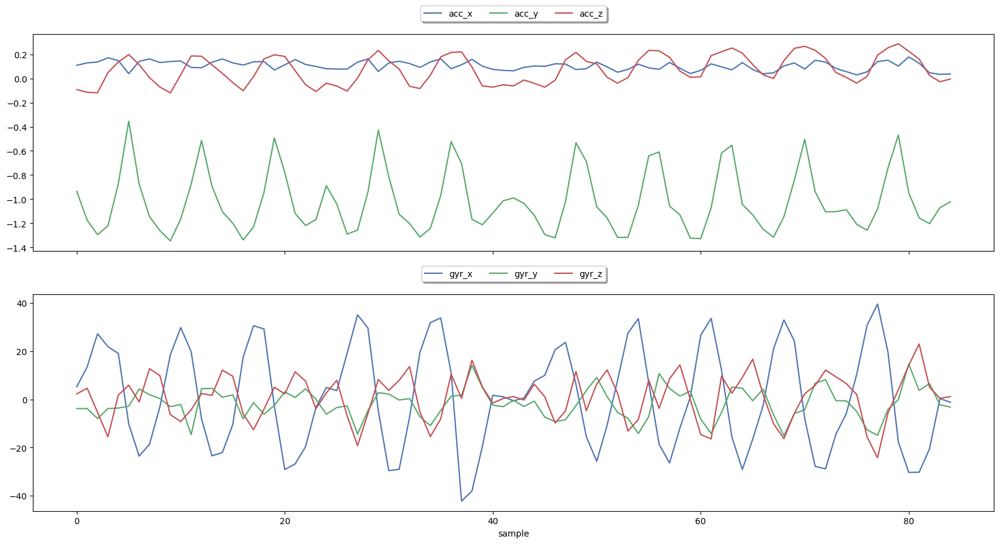

In [20]:
labels = "row"
participants = "A"

combine_plot_df = df.query(f"label =='{labels}'") .query(f"participant == '{participants}'") .reset_index(drop = True)

fig , ax = plt.subplots(nrows = 2,sharex = True ,figsize=(20,10))

combine_plot_df[['acc_x','acc_y','acc_z']].plot(ax=ax[0])
combine_plot_df[['gyr_x','gyr_y','gyr_z']].plot(ax=ax[1])

ax[0].legend(loc="upper center" , bbox_to_anchor=(0.5,1.15),ncol=3,fancybox = True,shadow = True)
ax[1].legend(loc="upper center" , bbox_to_anchor=(0.5,1.15),ncol=3,fancybox = True,shadow = True)
ax[1].set_xlabel('sample')




# Loop over all combinations and export for both sensors

In [21]:
labels = df['label'].unique()
participants = df['participant'].unique()

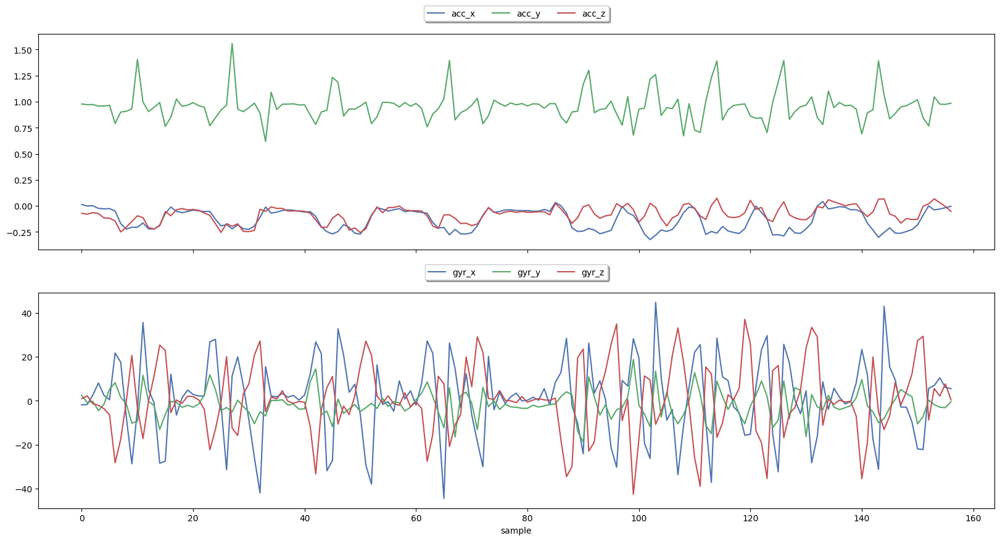

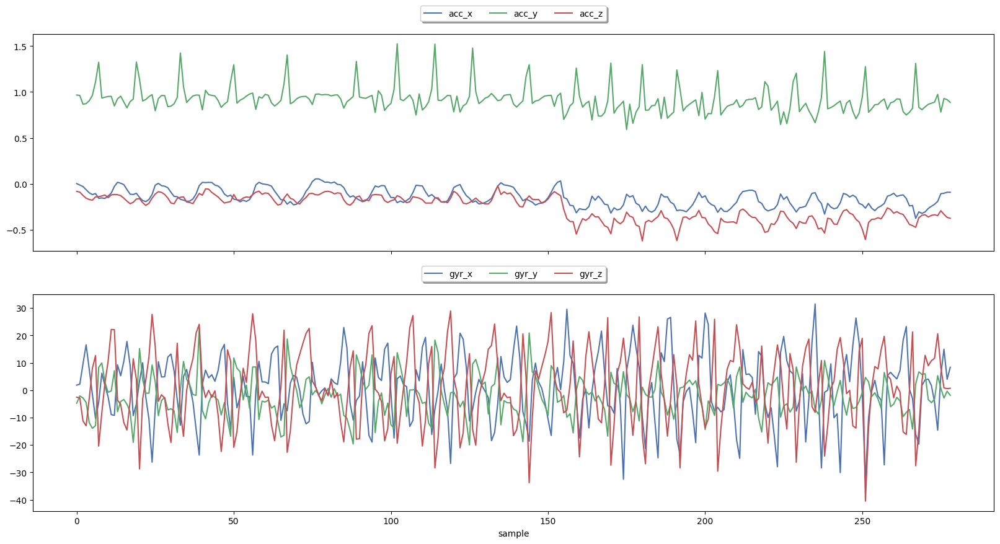

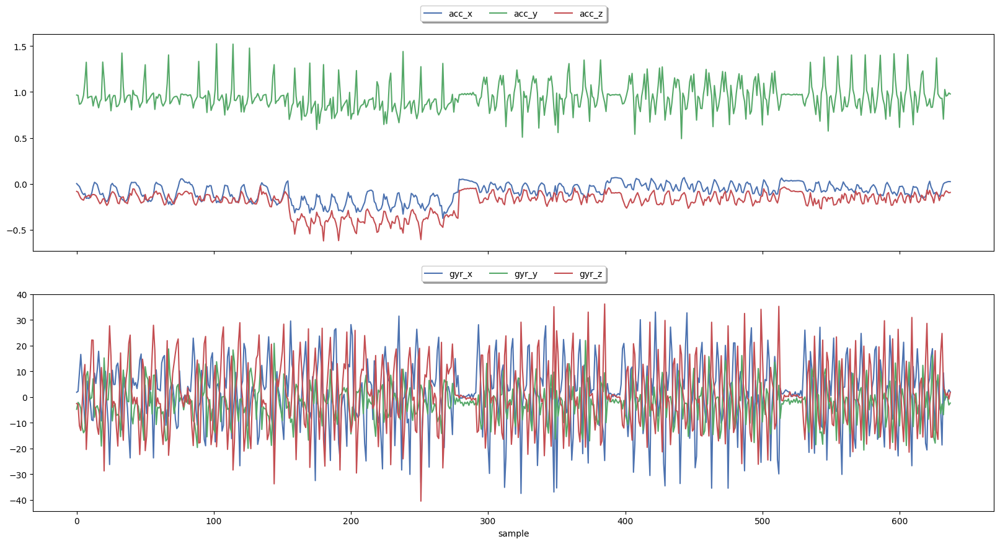

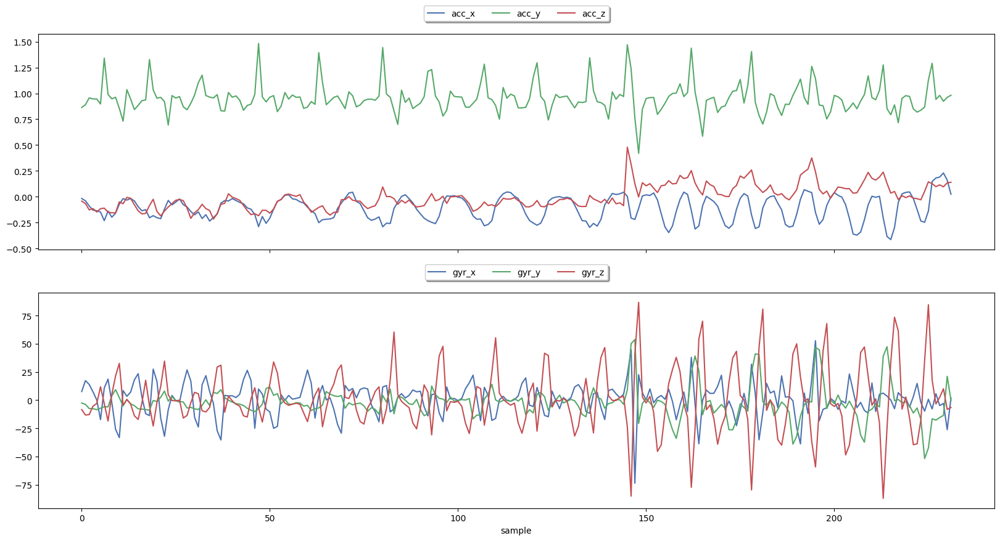

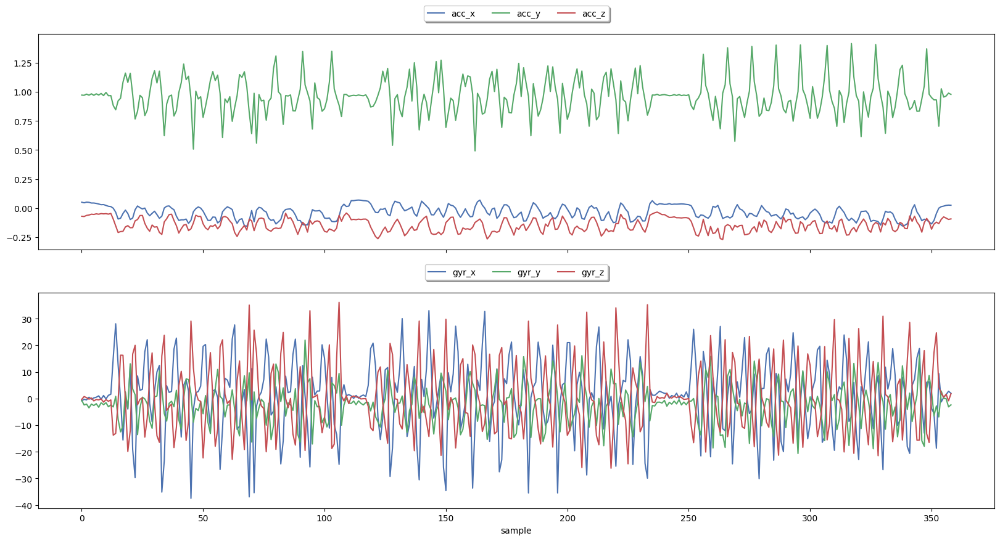

...

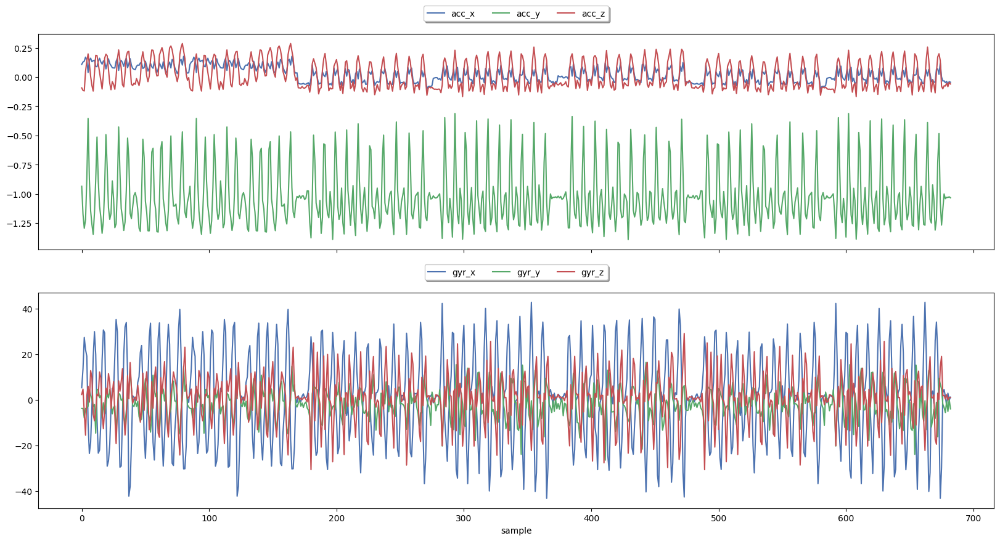

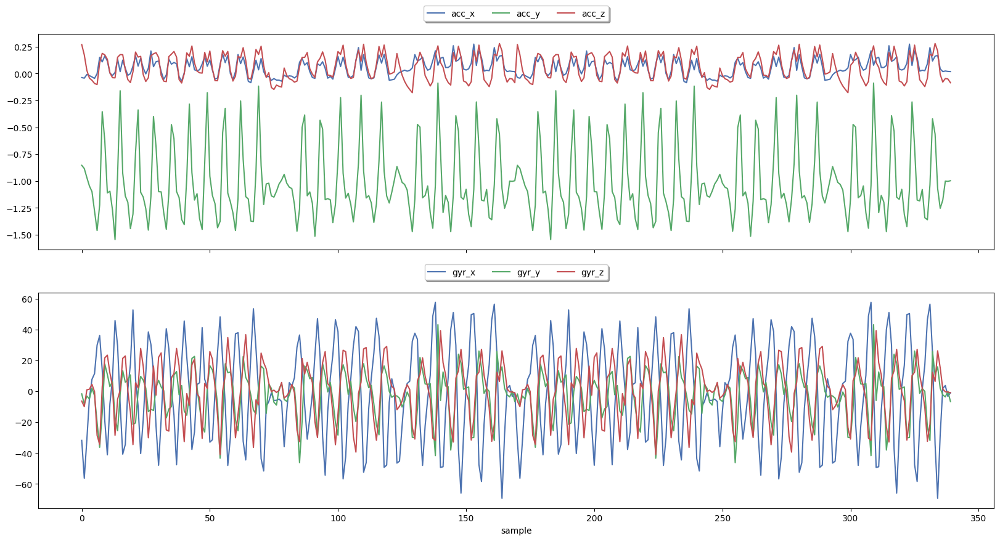

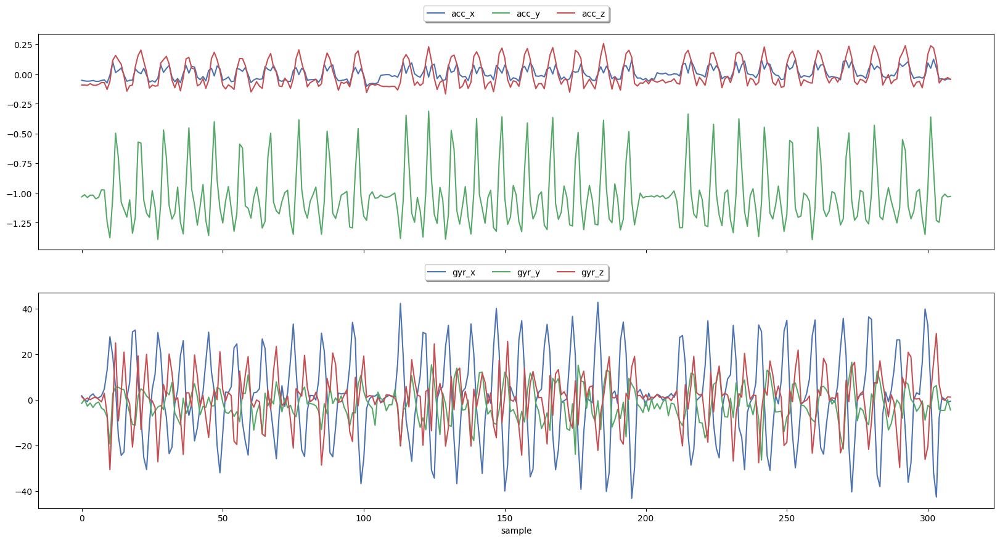

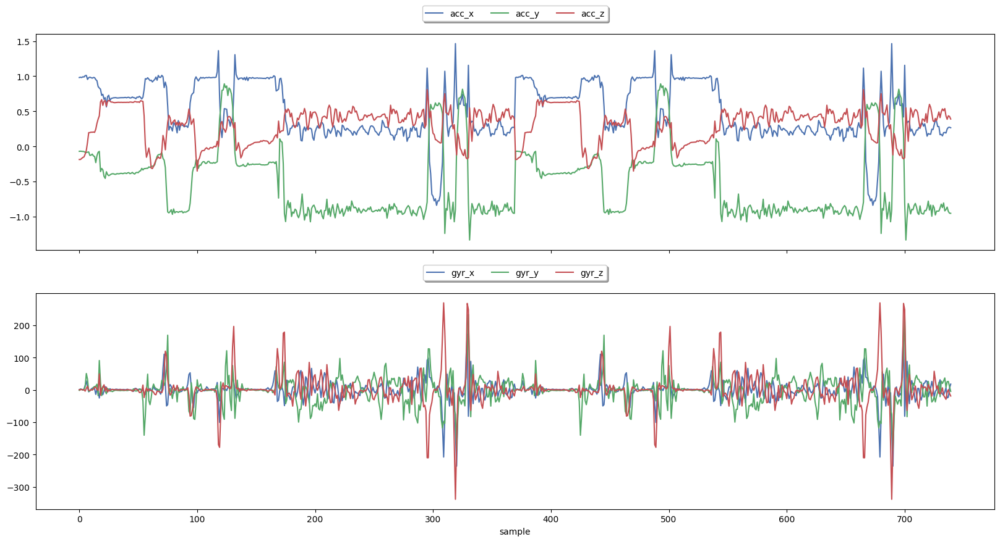

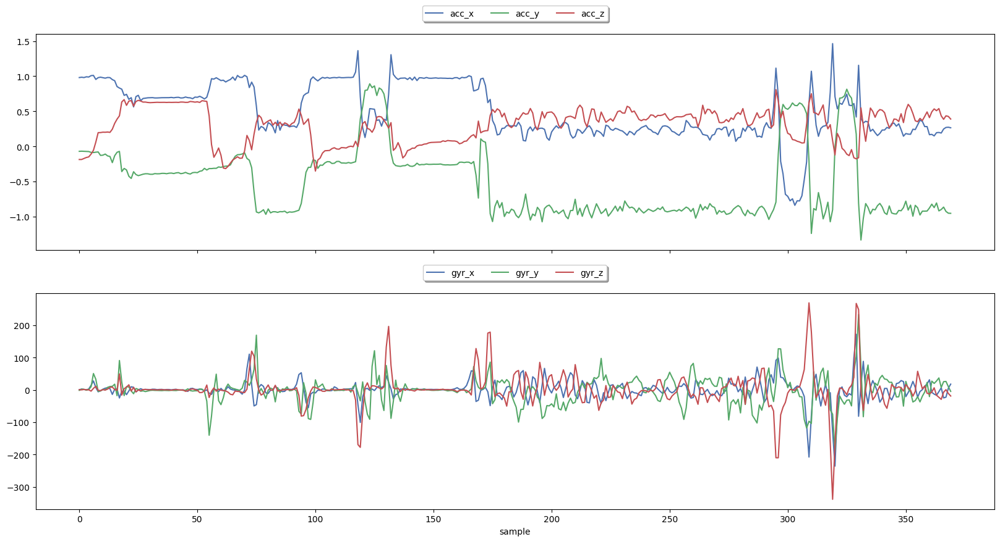

In [22]:
labels = df['label'].unique()
participants = df['participant'].unique()

for label in labels:
    for participant in participants:
      combine_plot_df = (df.query(f"label =='{label}'") .query(f"participant == '{participant}'") .reset_index(drop = True))


      if len(combine_plot_df) >0:

        fig , ax = plt.subplots(nrows = 2,sharex = True ,figsize=(20,10))


        combine_plot_df[['acc_x','acc_y','acc_z']].plot(ax=ax[0])
        combine_plot_df[['gyr_x','gyr_y','gyr_z']].plot(ax=ax[1])

        ax[0].legend(loc="upper center" , bbox_to_anchor=(0.5,1.15),ncol=3,fancybox = True,shadow = True)
        ax[1].legend(loc="upper center" , bbox_to_anchor=(0.5,1.15),ncol=3,fancybox = True,shadow = True)
        ax[1].set_xlabel('sample')

        plt.savefig(f"/content/drive/MyDrive/FitnessTracker/FitnessTracker/data-science-template-main/reports/figures/{label.title()} ({participant}).png")
        plt.show()